# Face Similarity using VGGFace on the Totally Looks Like dataset that was cleaned and prepared specifically for facial similarity.

## Normally the dataset contains two folders (left and right; image a in left is similar to image a in right) but we decided to add another folder wich combine both folders and leave the similar images next to each other.

In [1]:
import pandas as pd
import scipy.io
import numpy as np


from datetime import datetime, timedelta
import time

import tensorflow as tf


import keras 
from keras.preprocessing import image


from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.layers import Dense, Activation, Dropout, Flatten, Input, Convolution2D, ZeroPadding2D, MaxPooling2D, Activation
from keras.layers import Conv2D, AveragePooling2D
from keras.models import Model, Sequential
from keras import metrics
from keras.models import model_from_json
from keras.applications.imagenet_utils import preprocess_input
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt

import cv2

import pandas as pd

import numpy as np


In [2]:

#open-cv's face detection module
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [3]:
import os
from pathlib import Path
#Change directory to root
path = Path(os.getcwd())
root_dir = path.parent.absolute()
os.chdir(str(root_dir))

In [4]:
#Get all the images names in a list 
r="/data/combined"
mypath=str(root_dir)+r
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
onlyfiles

['00003 (2).jpg',
 '00003.jpg',
 '00010 (2).jpg',
 '00010.jpg',
 '00016 (2).jpg',
 '00016.jpg',
 '00018 (2).jpg',
 '00018.jpg',
 '00020 (2).jpg',
 '00020.jpg',
 '00022 (2).jpg',
 '00022.jpg',
 '00025 (2).jpg',
 '00025.jpg',
 '00030 (2).jpg',
 '00030.jpg',
 '00035 (2).jpg',
 '00035.jpg',
 '00042 (2).jpg',
 '00042.jpg',
 '00047 (2).jpg',
 '00047.jpg',
 '00051 (2).jpg',
 '00051.jpg',
 '00062 (2).jpg',
 '00062.jpg',
 '00066 (2).jpg',
 '00066.jpg',
 '00068 (2).jpg',
 '00068.jpg',
 '00070 (2).jpg',
 '00070.jpg',
 '00072 (2).jpg',
 '00072.jpg',
 '00074 (2).jpg',
 '00074.jpg',
 '00075 (2).jpg',
 '00075.jpg',
 '00076 (2).jpg',
 '00076.jpg',
 '00080 (2).jpg',
 '00080.jpg',
 '00083 (2).jpg',
 '00083.jpg',
 '00087 (2).jpg',
 '00087.jpg',
 '00088 (2).jpg',
 '00088.jpg',
 '00089 (2).jpg',
 '00089.jpg',
 '00099 (2).jpg',
 '00099.jpg',
 '00101 (2).jpg',
 '00101.jpg',
 '00103 (2).jpg',
 '00103.jpg',
 '00104 (2).jpg',
 '00104.jpg',
 '00105 (2).jpg',
 '00105.jpg',
 '00130 (2).jpg',
 '00130.jpg',
 '00138 

In [5]:
mypath

'C:\\Users\\user\\Face Similarity using Deep Learning/data/combined'

In [6]:
#Building the VGGFace model
model = Sequential()
model.add(ZeroPadding2D((1,1),input_shape=(224,224, 3)))
model.add(Convolution2D(64, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(128, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(ZeroPadding2D((1,1)))
model.add(Convolution2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D((2,2), strides=(2,2)))
 
model.add(Convolution2D(4096, (7, 7), activation='relu'))
model.add(Dropout(0.5))
model.add(Convolution2D(4096, (1, 1), activation='relu'))
model.add(Dropout(0.5))
model.add(Convolution2D(2622, (1, 1)))
model.add(Flatten())
model.add(Activation('softmax'))

In [7]:
#Loading the vggface model weights
#Pretrained weights: https://drive.google.com/file/d/1CPSeum3HpopfomUEK1gybeuIVoeJT_Eo/view?usp=sharing
#Download it and put it in the same folder as the notebook.
from keras.models import model_from_json
model.load_weights(str(path) +'/vgg_face_weights.h5')

In [8]:
#removing the last two layers so that we only present the images in the embedding
vgg_face_descriptor = Model(inputs=model.layers[0].input
, outputs=model.layers[-2].output)

In [9]:
#preprocessing of images to extract the faces only and prepare it for the model that accepts only 224x224 as output
def preprocess_image(image_path,p):
    img = cv2.imread(p+image_path)
    faces = face_cascade.detectMultiScale(img, 1.3, 5)
    for (x,y,w,h) in faces:
        img = img[int(y):int(y+h), int(x):int(x+w)]
        
    detected_face = cv2.resize(img, (224, 224))
    
    img = img_to_array(detected_face)
    img = np.expand_dims(img, axis=0)
    img =preprocess_input(img)
    return img

In [10]:
#VGGFace representation on all images
def VGGFeature(path):
    r="/data/combined"
    mypath=str(root_dir)+r
    dir=mypath
    
    try:
        representation = vgg_face_descriptor.predict(preprocess_image(path,dir))[0,:]
    except:
        representation= None
    return representation

## It takes some times to represent all images so to save time use the pickle file that contains all the vgg values

In [11]:

mypath=str(root_dir)+'/pickle/VGG/'
v=pd.read_pickle(mypath+ 'combinedVGG.pkl')

In [12]:
mypath

'C:\\Users\\user\\Face Similarity using Deep Learning/pickle/VGG/'

In [13]:
v

,path,VGG
0,00003 (2).jpg,"[2.358688, -1.7594296, 1.6152322, 3.0069342, 0..."
1,00003.jpg,"[3.060477, -0.13289273, 0.90607125, 1.5627009,..."
2,00010 (2).jpg,"[1.7589378, -2.4950275, -1.542548, 2.465595, 0..."
3,00010.jpg,"[-0.21445937, -2.0057573, -0.55780536, 4.06871..."
4,00016 (2).jpg,"[-1.0276625, -1.8849767, 0.28857058, 2.1206589..."
...,...,...
1595,06005.jpg,"[4.4966297, -4.1108065, -2.2082958, 2.8996317,..."
1596,07182 (2).jpg,"[3.056606, 0.4640472, 0.61385614, 4.250695, -0..."
1597,07182.jpg,"[5.584604, -0.2810822, -0.2076623, 2.4632146, ..."
1598,07183 (2).jpg,"[4.674432, -0.50923884, -1.8016448, 3.9365911,..."


## We will be using 2 metrics for the similarity that are the cosine similarity and the euclidean distance.

In [14]:
def findCosineSimilarity(source_representation, test_representation):
    a = np.matmul(np.transpose(source_representation), test_representation)
    b = np.sum(np.multiply(source_representation, source_representation))
    c = np.sum(np.multiply(test_representation, test_representation))
    return 1 - (a / (np.sqrt(b) * np.sqrt(c)))


In [15]:
def SimilarityCos(representation, img1_representation):
    
    cosine_similarity = findCosineSimilarity(img1_representation, representation)
   
    return cosine_similarity

In [16]:
def findEuclideanDistance(source_representation, test_representation):
    euclidean_distance = source_representation - test_representation
    euclidean_distance = np.sum(np.multiply(euclidean_distance, euclidean_distance))
    euclidean_distance = np.sqrt(euclidean_distance)
    return euclidean_distance

In [17]:
def SimilarityEuc(representation, img1_representation):
   
    euclidean_distance = findEuclideanDistance(img1_representation, representation)
    return euclidean_distance

## We will be comparing each image with all images using those two metrics.

In [18]:
'''
%%time
cos=np.zeros((1600,1600))
for i in range(1600):
    a=v.VGG[i]
    if(i==582):
        a=right.VGG[292]
    for j in range(1600):
        b=v.VGG[j]
        if(j==582):
            b=right.VGG[292]
        cos[i][j]=SimilarityCos(a,b)
'''

'\n%%time\ncos=np.zeros((1600,1600))\nfor i in range(1600):\n    a=v.VGG[i]\n    if(i==582):\n        a=right.VGG[292]\n    for j in range(1600):\n        b=v.VGG[j]\n        if(j==582):\n            b=right.VGG[292]\n        cos[i][j]=SimilarityCos(a,b)\n'

In [19]:
'''
%%time
euc=np.zeros((1600,1600))
for i in range(1600):
    a=v.VGG[i]
    if(i==582):
        a=right.VGG[292]
    for j in range(1600):
        b=v.VGG[j]
        if(j==582):
            b=right.VGG[292]
        euc[i][j]=SimilarityEuc(a,b)
 '''       

'\n%%time\neuc=np.zeros((1600,1600))\nfor i in range(1600):\n    a=v.VGG[i]\n    if(i==582):\n        a=right.VGG[292]\n    for j in range(1600):\n        b=v.VGG[j]\n        if(j==582):\n            b=right.VGG[292]\n        euc[i][j]=SimilarityEuc(a,b)\n '

In [20]:
#np.save('combinedEuc.npy',euc)

In [21]:
#np.save('combinedCos.npy',cos)

## Again to save time we already did all calculations and saved them in numpy files.


In [22]:
mypath=str(root_dir)+'/numpy/VGG/'
cos=np.load(mypath + 'combinedCos.npy')
cos

array([[ 1.78813934e-07,  2.37783253e-01,  4.55295563e-01, ...,
         3.78739536e-01,  5.37705153e-01,  5.18454820e-01],
       [ 2.37783253e-01,  0.00000000e+00,  5.12557954e-01, ...,
         4.29962277e-01,  5.83784968e-01,  6.09977007e-01],
       [ 4.55295563e-01,  5.12557954e-01, -2.38418579e-07, ...,
         4.10777450e-01,  4.29999232e-01,  4.36011612e-01],
       ...,
       [ 3.78739536e-01,  4.29962277e-01,  4.10777450e-01, ...,
        -1.19209290e-07,  5.06334782e-01,  4.57923412e-01],
       [ 5.37705153e-01,  5.83784968e-01,  4.29999232e-01, ...,
         5.06334782e-01, -1.19209290e-07,  3.33227396e-01],
       [ 5.18454820e-01,  6.09977007e-01,  4.36011612e-01, ...,
         4.57923412e-01,  3.33227396e-01,  5.96046448e-08]])

In [23]:
mypath=str(root_dir)+'/numpy/VGG/'
euc=np.load(mypath +'combinedEuc.npy')
euc

array([[  0.        ,  67.02633667,  93.19358063, ...,  94.14316559,
        128.30899048, 105.56855774],
       [ 67.02633667,   0.        ,  99.02888489, ..., 100.16374207,
        133.18766785, 114.53566742],
       [ 93.19358063,  99.02888489,   0.        , ...,  98.25963593,
        116.53084564,  97.38822937],
       ...,
       [ 94.14316559, 100.16374207,  98.25963593, ...,   0.        ,
        130.41650391, 107.84274292],
       [128.30899048, 133.18766785, 116.53084564, ..., 130.41650391,
          0.        , 105.56881714],
       [105.56855774, 114.53566742,  97.38822937, ..., 107.84274292,
        105.56881714,   0.        ]])

## After measuring the similarity using both measures we will be sorting the matrix obtained based on the indexes and we will see for each face the top faces going from the top 1 till top 5.

## Bearing in mind that we have our dataset which will be comparing our results with.

In [24]:
argcos=cos.argsort(axis=1)
argcos

array([[   0,    1,   53, ..., 1528, 1529,  922],
       [   1,    0, 1246, ...,  992,  922,  918],
       [   2,  297, 1033, ...,  803,  556,  922],
       ...,
       [1597,  260,  659, ..., 1092,  389,  922],
       [1598,  873,  720, ...,   48,  427,  922],
       [1599, 1138,  873, ...,  593,   48,  922]], dtype=int64)

In [25]:
argeuc=euc.argsort(axis=1)
argeuc

array([[   0,    1, 1336, ...,  918,  556,  740],
       [   1,    0,   42, ...,  918,  740,  556],
       [   2,  173, 1360, ..., 1081,  740,  556],
       ...,
       [1597,  260, 1247, ..., 1081,  740,  556],
       [1598,  873,  721, ...,  593,  740,  556],
       [1599, 1315, 1138, ...,  593,  740,  556]], dtype=int64)

In [26]:
co=argcos[:,:2]
eu=argeuc[:,:2]


In [27]:
co

array([[   0,    1],
       [   1,    0],
       [   2,  297],
       ...,
       [1597,  260],
       [1598,  873],
       [1599, 1138]], dtype=int64)

In [28]:
eu

array([[   0,    1],
       [   1,    0],
       [   2,  173],
       ...,
       [1597,  260],
       [1598,  873],
       [1599, 1315]], dtype=int64)

In [29]:
c=[]
e=[]

for i in range(1600):
    if(i%2==0):
        if (i in co[i] and i+1 in co[i]):
            c.append(1)  
        else:
            c.append(0)
    if(i%2!=0):
        if(i in co[i] and i-1 in co[i]):
            c.append(1)
        else:
            c.append(0)
    if(i%2==0):
        if (i in eu[i] and i+1 in eu[i]):
            e.append(1)  
        else:
            e.append(0)
    if(i%2!=0):
        if(i in eu[i] and i-1 in eu[i]):
            e.append(1)
        else:
            e.append(0)
   

In [30]:
c

[1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [31]:
#Number of times  that the target image appears as the most similar one by cosine similarity.
np.sum(c)

234

In [32]:
e

[1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [33]:
#Number of times  that the target image appears as the most similar one by the euclidean distance.
np.sum(e)

187

In [34]:
#Checking the indexes of the images that appeared as most similar in accordance with the dataset.
cI=[]
eI=[]

for i in range(1600):
    
    if(e[i]==1):
        eI.append(i)
    if(c[i]==1):
        cI.append(i)

In [35]:
cI

[0,
 1,
 4,
 20,
 24,
 25,
 26,
 27,
 35,
 44,
 45,
 48,
 49,
 52,
 67,
 71,
 74,
 102,
 106,
 107,
 110,
 111,
 116,
 124,
 125,
 136,
 139,
 143,
 144,
 174,
 175,
 187,
 197,
 212,
 216,
 222,
 223,
 226,
 236,
 237,
 239,
 266,
 269,
 286,
 287,
 293,
 300,
 301,
 356,
 375,
 382,
 406,
 407,
 438,
 439,
 440,
 441,
 454,
 455,
 461,
 474,
 478,
 487,
 493,
 494,
 500,
 502,
 503,
 506,
 507,
 516,
 518,
 520,
 526,
 532,
 533,
 538,
 539,
 565,
 567,
 569,
 570,
 571,
 579,
 585,
 606,
 607,
 608,
 610,
 611,
 618,
 619,
 621,
 623,
 658,
 659,
 660,
 668,
 672,
 673,
 675,
 678,
 693,
 702,
 710,
 711,
 724,
 725,
 730,
 731,
 734,
 735,
 745,
 746,
 754,
 760,
 761,
 772,
 773,
 774,
 775,
 776,
 779,
 780,
 781,
 796,
 831,
 838,
 844,
 845,
 848,
 849,
 850,
 856,
 857,
 865,
 866,
 872,
 880,
 881,
 888,
 890,
 894,
 895,
 898,
 899,
 906,
 920,
 921,
 939,
 952,
 953,
 961,
 972,
 987,
 992,
 993,
 1000,
 1002,
 1014,
 1015,
 1020,
 1021,
 1026,
 1027,
 1032,
 1036,
 1042,
 

In [36]:
eI

[0,
 1,
 20,
 22,
 24,
 25,
 44,
 45,
 48,
 74,
 78,
 102,
 106,
 107,
 110,
 123,
 124,
 125,
 137,
 143,
 144,
 166,
 174,
 175,
 178,
 196,
 197,
 212,
 216,
 222,
 223,
 236,
 239,
 269,
 285,
 286,
 287,
 292,
 300,
 301,
 324,
 333,
 345,
 368,
 375,
 406,
 407,
 419,
 438,
 440,
 441,
 454,
 455,
 461,
 466,
 479,
 494,
 502,
 506,
 518,
 521,
 532,
 538,
 552,
 571,
 579,
 607,
 608,
 610,
 611,
 618,
 633,
 658,
 659,
 672,
 673,
 674,
 703,
 707,
 711,
 724,
 725,
 730,
 731,
 735,
 740,
 746,
 754,
 755,
 761,
 772,
 775,
 776,
 779,
 781,
 808,
 815,
 833,
 838,
 844,
 849,
 857,
 865,
 866,
 872,
 873,
 877,
 880,
 888,
 890,
 893,
 894,
 895,
 898,
 906,
 911,
 920,
 937,
 953,
 960,
 966,
 992,
 993,
 1010,
 1014,
 1020,
 1021,
 1026,
 1032,
 1037,
 1042,
 1048,
 1055,
 1056,
 1068,
 1069,
 1074,
 1105,
 1107,
 1110,
 1131,
 1133,
 1155,
 1156,
 1159,
 1160,
 1161,
 1180,
 1181,
 1188,
 1189,
 1198,
 1202,
 1214,
 1218,
 1219,
 1224,
 1269,
 1274,
 1282,
 1293,
 1296,
 1

## We will check now if the target image will appear at least in top 2 as the most similar.

In [37]:
co2=argcos[:,:3]
eu2=argeuc[:,:3]

In [38]:
co2

array([[   0,    1,   53],
       [   1,    0, 1246],
       [   2,  297, 1033],
       ...,
       [1597,  260,  659],
       [1598,  873,  720],
       [1599, 1138,  873]], dtype=int64)

In [39]:
eu2

array([[   0,    1, 1336],
       [   1,    0,   42],
       [   2,  173, 1360],
       ...,
       [1597,  260, 1247],
       [1598,  873,  721],
       [1599, 1315, 1138]], dtype=int64)

In [40]:
c2=[]
e2=[]

for i in range(1600):
    if(i%2==0):
        if (i in co2[i] and i+1 in co2[i]):
            c2.append(1)  
        else:
            c2.append(0)
    if(i%2!=0):
        if(i in co2[i] and i-1 in co2[i]):
            c2.append(1)
        else:
            c2.append(0)
    if(i%2==0):
        if (i in eu2[i] and i+1 in eu2[i]):
            e2.append(1)  
        else:
            e2.append(0)
    if(i%2!=0):
        if(i in eu2[i] and i-1 in eu2[i]):
            e2.append(1)
        else:
            e2.append(0)
   

In [41]:
np.sum(c2)

403

In [42]:
np.sum(e2)

312

In [43]:
c2I=[]
e2I=[]

for i in range(1600):
    
    if(e2[i]==1):
        e2I.append(i)
    if(c2[i]==1):
        c2I.append(i)

In [44]:
e2I

[0,
 1,
 4,
 7,
 11,
 20,
 22,
 24,
 25,
 27,
 34,
 41,
 44,
 45,
 48,
 49,
 51,
 67,
 74,
 78,
 82,
 99,
 102,
 106,
 107,
 108,
 110,
 123,
 124,
 125,
 127,
 136,
 137,
 138,
 142,
 143,
 144,
 166,
 172,
 174,
 175,
 178,
 179,
 186,
 196,
 197,
 212,
 214,
 215,
 216,
 217,
 222,
 223,
 226,
 227,
 236,
 239,
 243,
 255,
 258,
 260,
 261,
 267,
 269,
 285,
 286,
 287,
 292,
 300,
 301,
 312,
 324,
 332,
 333,
 339,
 345,
 357,
 359,
 368,
 375,
 388,
 394,
 406,
 407,
 417,
 419,
 429,
 433,
 437,
 438,
 440,
 441,
 451,
 453,
 454,
 455,
 460,
 461,
 466,
 467,
 474,
 477,
 479,
 487,
 492,
 494,
 497,
 499,
 502,
 506,
 510,
 518,
 521,
 527,
 529,
 532,
 533,
 538,
 539,
 552,
 564,
 571,
 572,
 579,
 585,
 588,
 590,
 605,
 607,
 608,
 609,
 610,
 611,
 616,
 617,
 618,
 619,
 623,
 633,
 658,
 659,
 672,
 673,
 674,
 679,
 684,
 693,
 703,
 707,
 711,
 724,
 725,
 730,
 731,
 735,
 737,
 740,
 744,
 746,
 754,
 755,
 761,
 772,
 775,
 776,
 779,
 781,
 797,
 808,
 815,
 833,


In [45]:
c2I

[0,
 1,
 4,
 7,
 8,
 11,
 20,
 21,
 24,
 25,
 26,
 27,
 35,
 41,
 44,
 45,
 47,
 48,
 49,
 52,
 64,
 67,
 71,
 72,
 74,
 82,
 83,
 91,
 93,
 102,
 103,
 106,
 107,
 109,
 110,
 111,
 116,
 122,
 123,
 124,
 125,
 127,
 136,
 138,
 139,
 142,
 143,
 144,
 145,
 146,
 166,
 174,
 175,
 178,
 179,
 186,
 187,
 196,
 197,
 212,
 213,
 214,
 215,
 216,
 217,
 222,
 223,
 226,
 227,
 236,
 237,
 238,
 239,
 258,
 259,
 260,
 261,
 266,
 267,
 268,
 269,
 274,
 284,
 285,
 286,
 287,
 292,
 293,
 300,
 301,
 312,
 313,
 327,
 332,
 333,
 353,
 356,
 357,
 358,
 359,
 368,
 369,
 374,
 375,
 382,
 388,
 394,
 406,
 407,
 417,
 419,
 428,
 429,
 433,
 438,
 439,
 440,
 441,
 454,
 455,
 461,
 474,
 475,
 478,
 479,
 487,
 488,
 493,
 494,
 497,
 500,
 501,
 502,
 503,
 506,
 507,
 510,
 516,
 518,
 520,
 521,
 526,
 527,
 528,
 529,
 532,
 533,
 538,
 539,
 546,
 552,
 553,
 559,
 564,
 565,
 566,
 567,
 569,
 570,
 571,
 579,
 585,
 588,
 606,
 607,
 608,
 609,
 610,
 611,
 616,
 618,
 619,
 6

## We will check now if the target image will appear at least in top 3 as the most similar.

In [46]:
co3=argcos[:,:4]
eu3=argeuc[:,:4]

In [47]:
co3

array([[   0,    1,   53, 1522],
       [   1,    0, 1246, 1389],
       [   2,  297, 1033,  348],
       ...,
       [1597,  260,  659, 1247],
       [1598,  873,  720,  721],
       [1599, 1138,  873, 1527]], dtype=int64)

In [48]:
eu3

array([[   0,    1, 1336,   82],
       [   1,    0,   42,  342],
       [   2,  173, 1360,  238],
       ...,
       [1597,  260, 1247,  261],
       [1598,  873,  721,  414],
       [1599, 1315, 1138, 1310]], dtype=int64)

In [49]:
c3=[]
e3=[]

for i in range(1600):
    if(i%2==0):
        if (i in co3[i] and i+1 in co3[i]):
            c3.append(1)  
        else:
            c3.append(0)
    if(i%2!=0):
        if(i in co3[i] and i-1 in co3[i]):
            c3.append(1)
        else:
            c3.append(0)
    if(i%2==0):
        if (i in eu3[i] and i+1 in eu3[i]):
            e3.append(1)  
        else:
            e3.append(0)
    if(i%2!=0):
        if(i in eu3[i] and i-1 in eu3[i]):
            e3.append(1)
        else:
            e3.append(0)
   

In [50]:
np.sum(c3)

506

In [51]:
np.sum(e3)

387

In [52]:
c3I=[]
e3I=[]

for i in range(1600):
    
    if(e3[i]==1):
        e3I.append(i)
    if(c3[i]==1):
        c3I.append(i)

In [53]:
c3I

[0,
 1,
 4,
 7,
 8,
 10,
 11,
 20,
 21,
 24,
 25,
 26,
 27,
 33,
 35,
 41,
 44,
 45,
 47,
 48,
 49,
 52,
 64,
 66,
 67,
 68,
 71,
 72,
 73,
 74,
 75,
 78,
 82,
 83,
 88,
 91,
 93,
 99,
 102,
 103,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 116,
 117,
 122,
 123,
 124,
 125,
 127,
 136,
 137,
 138,
 139,
 142,
 143,
 144,
 145,
 146,
 166,
 170,
 174,
 175,
 178,
 179,
 186,
 187,
 190,
 196,
 197,
 212,
 213,
 214,
 215,
 216,
 217,
 221,
 222,
 223,
 226,
 227,
 236,
 237,
 238,
 239,
 242,
 243,
 258,
 259,
 260,
 261,
 266,
 267,
 268,
 269,
 274,
 284,
 285,
 286,
 287,
 292,
 293,
 297,
 300,
 301,
 309,
 312,
 313,
 318,
 327,
 332,
 333,
 345,
 352,
 353,
 356,
 357,
 358,
 359,
 368,
 369,
 374,
 375,
 382,
 388,
 394,
 395,
 406,
 407,
 416,
 417,
 419,
 428,
 429,
 433,
 438,
 439,
 440,
 441,
 450,
 451,
 452,
 453,
 454,
 455,
 460,
 461,
 462,
 474,
 475,
 477,
 478,
 479,
 487,
 488,
 492,
 493,
 494,
 497,
 500,
 501,
 502,
 503,
 506,
 507,
 510,
 511,
 516,
 518,
 520,

In [54]:
e3I

[0,
 1,
 4,
 7,
 11,
 20,
 22,
 24,
 25,
 27,
 33,
 34,
 41,
 44,
 45,
 48,
 49,
 51,
 63,
 66,
 67,
 68,
 72,
 74,
 78,
 82,
 85,
 90,
 99,
 102,
 105,
 106,
 107,
 108,
 110,
 123,
 124,
 125,
 127,
 136,
 137,
 138,
 141,
 142,
 143,
 144,
 147,
 151,
 166,
 172,
 174,
 175,
 178,
 179,
 186,
 189,
 196,
 197,
 204,
 212,
 214,
 215,
 216,
 217,
 222,
 223,
 226,
 227,
 236,
 239,
 242,
 243,
 255,
 258,
 260,
 261,
 267,
 269,
 285,
 286,
 287,
 292,
 297,
 300,
 301,
 312,
 318,
 319,
 324,
 332,
 333,
 339,
 345,
 352,
 353,
 354,
 357,
 359,
 368,
 375,
 380,
 383,
 388,
 394,
 395,
 406,
 407,
 416,
 417,
 419,
 429,
 433,
 437,
 438,
 440,
 441,
 451,
 453,
 454,
 455,
 460,
 461,
 466,
 467,
 474,
 477,
 479,
 487,
 489,
 492,
 494,
 497,
 499,
 501,
 502,
 505,
 506,
 510,
 511,
 518,
 520,
 521,
 527,
 529,
 532,
 533,
 538,
 539,
 552,
 564,
 568,
 569,
 571,
 572,
 579,
 585,
 588,
 590,
 601,
 605,
 607,
 608,
 609,
 610,
 611,
 616,
 617,
 618,
 619,
 623,
 633,
 658,
 

## We will check now if the target image will appear at least in top 4 as the most similar.

In [55]:
co4=argcos[:,:5]
eu4=argeuc[:,:5]

In [56]:
co4

array([[   0,    1,   53, 1522,  463],
       [   1,    0, 1246, 1389, 1174],
       [   2,  297, 1033,  348,  173],
       ...,
       [1597,  260,  659, 1247,  261],
       [1598,  873,  720,  721,  414],
       [1599, 1138,  873, 1527,  720]], dtype=int64)

In [57]:
eu4

array([[   0,    1, 1336,   82,  520],
       [   1,    0,   42,  342, 1114],
       [   2,  173, 1360,  238, 1033],
       ...,
       [1597,  260, 1247,  261,   83],
       [1598,  873,  721,  414,  856],
       [1599, 1315, 1138, 1310, 1527]], dtype=int64)

In [58]:
c4=[]
e4=[]

for i in range(1600):
    if(i%2==0):
        if (i in co4[i] and i+1 in co4[i]):
            c4.append(1)  
        else:
            c4.append(0)
    if(i%2!=0):
        if(i in co4[i] and i-1 in co4[i]):
            c4.append(1)
        else:
            c4.append(0)
    if(i%2==0):
        if (i in eu4[i] and i+1 in eu4[i]):
            e4.append(1)  
        else:
            e4.append(0)
    if(i%2!=0):
        if(i in eu4[i] and i-1 in eu4[i]):
            e4.append(1)
        else:
            e4.append(0)

In [59]:
np.sum(c4)

584

In [60]:
np.sum(e4)

438

In [61]:
c4I=[]
e4I=[]

for i in range(1600):
    
    if(e4[i]==1):
        e4I.append(i)
    if(c4[i]==1):
        c4I.append(i)

In [62]:
c4I

[0,
 1,
 4,
 7,
 8,
 10,
 11,
 16,
 20,
 21,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 32,
 33,
 35,
 40,
 41,
 44,
 45,
 46,
 47,
 48,
 49,
 52,
 55,
 57,
 64,
 66,
 67,
 68,
 69,
 71,
 72,
 73,
 74,
 75,
 78,
 82,
 83,
 88,
 90,
 91,
 93,
 99,
 102,
 103,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 116,
 117,
 122,
 123,
 124,
 125,
 126,
 127,
 136,
 137,
 138,
 139,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 159,
 166,
 170,
 173,
 174,
 175,
 178,
 179,
 186,
 187,
 190,
 196,
 197,
 205,
 212,
 213,
 214,
 215,
 216,
 217,
 219,
 221,
 222,
 223,
 226,
 227,
 230,
 236,
 237,
 238,
 239,
 242,
 243,
 258,
 259,
 260,
 261,
 266,
 267,
 268,
 269,
 274,
 284,
 285,
 286,
 287,
 292,
 293,
 296,
 297,
 300,
 301,
 309,
 312,
 313,
 318,
 319,
 321,
 327,
 332,
 333,
 339,
 345,
 352,
 353,
 356,
 357,
 358,
 359,
 368,
 369,
 374,
 375,
 382,
 388,
 394,
 395,
 406,
 407,
 416,
 417,
 419,
 428,
 429,
 432,
 433,
 437,
 438,
 439,
 440,
 441,
 450,
 451,
 452,
 453,
 454,
 455,
 460,
 461

In [63]:
e4I

[0,
 1,
 4,
 7,
 11,
 20,
 22,
 24,
 25,
 27,
 33,
 34,
 41,
 44,
 45,
 46,
 48,
 49,
 51,
 63,
 64,
 66,
 67,
 68,
 72,
 74,
 78,
 82,
 83,
 85,
 90,
 99,
 102,
 103,
 105,
 106,
 107,
 108,
 110,
 117,
 123,
 124,
 125,
 126,
 127,
 136,
 137,
 138,
 141,
 142,
 143,
 144,
 145,
 147,
 148,
 151,
 166,
 172,
 174,
 175,
 178,
 179,
 186,
 189,
 196,
 197,
 204,
 212,
 214,
 215,
 216,
 217,
 222,
 223,
 226,
 227,
 236,
 239,
 242,
 243,
 255,
 258,
 260,
 261,
 267,
 269,
 284,
 285,
 286,
 287,
 292,
 297,
 300,
 301,
 312,
 318,
 319,
 324,
 332,
 333,
 339,
 345,
 352,
 353,
 354,
 357,
 359,
 368,
 375,
 380,
 383,
 388,
 394,
 395,
 406,
 407,
 416,
 417,
 419,
 421,
 429,
 433,
 437,
 438,
 440,
 441,
 451,
 453,
 454,
 455,
 460,
 461,
 466,
 467,
 474,
 477,
 479,
 487,
 489,
 492,
 494,
 495,
 497,
 499,
 501,
 502,
 505,
 506,
 510,
 511,
 518,
 520,
 521,
 527,
 529,
 532,
 533,
 538,
 539,
 546,
 552,
 558,
 564,
 568,
 569,
 571,
 572,
 579,
 585,
 588,
 589,
 590,
 599

## We will check now if the target image will appear at least in top 5 as the most similar.

In [64]:
co5=argcos[:,:6]
eu5=argeuc[:,:6]

In [65]:
co5

array([[   0,    1,   53, 1522,  463,  512],
       [   1,    0, 1246, 1389, 1174,  590],
       [   2,  297, 1033,  348,  173, 1360],
       ...,
       [1597,  260,  659, 1247,  261, 1596],
       [1598,  873,  720,  721,  414,  443],
       [1599, 1138,  873, 1527,  720,  793]], dtype=int64)

In [66]:
eu5

array([[   0,    1, 1336,   82,  520,  910],
       [   1,    0,   42,  342, 1114,   87],
       [   2,  173, 1360,  238, 1033, 1346],
       ...,
       [1597,  260, 1247,  261,   83, 1011],
       [1598,  873,  721,  414,  856,  328],
       [1599, 1315, 1138, 1310, 1527, 1500]], dtype=int64)

In [67]:
c5=[]
e5=[]

for i in range(1600):
    if(i%2==0):
        if (i in co5[i] and i+1 in co5[i]):
            c5.append(1)  
        else:
            c5.append(0)
    if(i%2!=0):
        if(i in co5[i] and i-1 in co5[i]):
            c5.append(1)
        else:
            c5.append(0)
    if(i%2==0):
        if (i in eu5[i] and i+1 in eu5[i]):
            e5.append(1)  
        else:
            e5.append(0)
    if(i%2!=0):
        if(i in eu5[i] and i-1 in eu5[i]):
            e5.append(1)
        else:
            e5.append(0)
   

In [68]:
np.sum(e5)

483

In [69]:
np.sum(c5)

640

In [70]:
c5I=[]
e5I=[]

for i in range(1600):
    
    if(e5[i]==1):
        e5I.append(i)
    if(c5[i]==1):
        c5I.append(i)

In [71]:
c5I

[0,
 1,
 4,
 7,
 8,
 10,
 11,
 15,
 16,
 20,
 21,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 32,
 33,
 34,
 35,
 40,
 41,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 52,
 54,
 55,
 56,
 57,
 61,
 64,
 66,
 67,
 68,
 69,
 71,
 72,
 73,
 74,
 75,
 78,
 82,
 83,
 88,
 90,
 91,
 93,
 99,
 102,
 103,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 116,
 117,
 122,
 123,
 124,
 125,
 126,
 127,
 136,
 137,
 138,
 139,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 158,
 159,
 166,
 170,
 173,
 174,
 175,
 178,
 179,
 186,
 187,
 189,
 190,
 191,
 196,
 197,
 205,
 212,
 213,
 214,
 215,
 216,
 217,
 219,
 221,
 222,
 223,
 226,
 227,
 230,
 236,
 237,
 238,
 239,
 242,
 243,
 254,
 255,
 258,
 259,
 260,
 261,
 266,
 267,
 268,
 269,
 274,
 284,
 285,
 286,
 287,
 292,
 293,
 295,
 296,
 297,
 300,
 301,
 309,
 312,
 313,
 318,
 319,
 321,
 326,
 327,
 332,
 333,
 339,
 344,
 345,
 352,
 353,
 356,
 357,
 358,
 359,
 368,
 369,
 374,
 375,
 382,
 383,
 388,
 389,
 394,
 395,
 406,
 407,
 416,
 417,
 419,
 428,
 429

In [72]:
e5I

[0,
 1,
 4,
 7,
 11,
 14,
 20,
 22,
 24,
 25,
 27,
 33,
 34,
 41,
 44,
 45,
 46,
 48,
 49,
 51,
 56,
 63,
 64,
 66,
 67,
 68,
 69,
 72,
 74,
 78,
 82,
 83,
 85,
 90,
 93,
 99,
 102,
 103,
 105,
 106,
 107,
 108,
 110,
 117,
 123,
 124,
 125,
 126,
 127,
 136,
 137,
 138,
 141,
 142,
 143,
 144,
 145,
 147,
 148,
 149,
 151,
 152,
 158,
 166,
 172,
 174,
 175,
 178,
 179,
 186,
 189,
 196,
 197,
 204,
 212,
 214,
 215,
 216,
 217,
 222,
 223,
 226,
 227,
 236,
 239,
 242,
 243,
 255,
 258,
 260,
 261,
 267,
 269,
 284,
 285,
 286,
 287,
 292,
 297,
 300,
 301,
 312,
 318,
 319,
 324,
 326,
 329,
 332,
 333,
 339,
 345,
 352,
 353,
 354,
 356,
 357,
 358,
 359,
 368,
 375,
 380,
 383,
 387,
 388,
 394,
 395,
 406,
 407,
 416,
 417,
 419,
 421,
 429,
 431,
 433,
 437,
 438,
 440,
 441,
 445,
 451,
 452,
 453,
 454,
 455,
 460,
 461,
 466,
 467,
 468,
 474,
 477,
 479,
 487,
 489,
 492,
 494,
 495,
 497,
 499,
 501,
 502,
 505,
 506,
 510,
 511,
 518,
 520,
 521,
 527,
 529,
 532,
 533,
 5

## We will be cheking the intersection between the two metrics

In [73]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

In [74]:
a=intersection(eI,cI)

In [75]:
len(a)

133

In [76]:
a

[0,
 1,
 20,
 24,
 25,
 44,
 45,
 48,
 74,
 102,
 106,
 107,
 110,
 124,
 125,
 143,
 144,
 174,
 175,
 197,
 212,
 216,
 222,
 223,
 236,
 239,
 269,
 286,
 287,
 300,
 301,
 375,
 406,
 407,
 438,
 440,
 441,
 454,
 455,
 461,
 494,
 502,
 506,
 518,
 532,
 538,
 571,
 579,
 607,
 608,
 610,
 611,
 618,
 658,
 659,
 672,
 673,
 711,
 724,
 725,
 730,
 731,
 735,
 746,
 754,
 761,
 772,
 775,
 776,
 779,
 781,
 838,
 844,
 849,
 857,
 865,
 866,
 872,
 880,
 888,
 890,
 894,
 895,
 898,
 906,
 920,
 953,
 992,
 993,
 1014,
 1020,
 1021,
 1026,
 1032,
 1042,
 1048,
 1055,
 1056,
 1068,
 1069,
 1105,
 1110,
 1131,
 1133,
 1156,
 1159,
 1160,
 1161,
 1180,
 1181,
 1188,
 1189,
 1198,
 1202,
 1214,
 1218,
 1219,
 1224,
 1274,
 1282,
 1293,
 1296,
 1319,
 1326,
 1359,
 1412,
 1413,
 1468,
 1492,
 1504,
 1538,
 1543,
 1579]

## Now we will be basing the results on the dataset but rather sorting the images to create new pairs using the two metrics and cheking them.

## We will be cheking the similarity of the images in both ways so that if an image A is the most similar to B than so should be B for A.

In [77]:
b=[]
d=[]
bI=[]
dI=[]
for i in range(len(co)):
    a=co[i][1]
    if(co[a][1]==i):
        b.append(1)
        bI.append(i)
        bI.append(a)
        
for i in range(len(eu)):
    a=eu[i][1]
    if(eu[a][1]==i):
        d.append(1)
        dI.append(i)
        dI.append(a)

In [78]:
b

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [79]:
d

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [80]:
bI

[0,
 1,
 1,
 0,
 3,
 280,
 5,
 21,
 6,
 372,
 8,
 361,
 9,
 615,
 12,
 784,
 17,
 327,
 18,
 1012,
 21,
 5,
 22,
 1099,
 23,
 188,
 24,
 25,
 25,
 24,
 26,
 27,
 27,
 26,
 28,
 806,
 31,
 755,
 33,
 254,
 36,
 531,
 37,
 1211,
 38,
 1151,
 40,
 80,
 42,
 1273,
 44,
 45,
 45,
 44,
 46,
 137,
 48,
 49,
 49,
 48,
 51,
 738,
 53,
 1278,
 55,
 1547,
 58,
 1269,
 59,
 948,
 60,
 66,
 62,
 484,
 64,
 142,
 66,
 60,
 68,
 510,
 69,
 511,
 73,
 77,
 77,
 73,
 79,
 801,
 80,
 40,
 81,
 524,
 82,
 1336,
 89,
 178,
 91,
 1311,
 94,
 446,
 95,
 95,
 97,
 995,
 99,
 451,
 101,
 1338,
 104,
 229,
 106,
 107,
 107,
 106,
 110,
 111,
 111,
 110,
 112,
 1333,
 115,
 943,
 120,
 709,
 121,
 647,
 124,
 125,
 125,
 124,
 126,
 548,
 131,
 1414,
 132,
 1546,
 133,
 1213,
 134,
 358,
 137,
 46,
 138,
 1175,
 140,
 1424,
 141,
 1040,
 142,
 64,
 145,
 457,
 147,
 383,
 148,
 1436,
 149,
 1437,
 150,
 716,
 154,
 1232,
 156,
 220,
 157,
 547,
 158,
 242,
 159,
 243,
 164,
 820,
 168,
 752,
 170,
 527,
 174,
 

In [81]:
#Number of images that are similar to each other in both ways by cosine similarity
np.sum(b)

753

## Almost half.

In [82]:
#Number of images that are similar to each other in both ways by the euclidean distance.
np.sum(d)

449

In [83]:
dI

[0,
 1,
 1,
 0,
 3,
 280,
 5,
 21,
 6,
 372,
 8,
 361,
 12,
 784,
 18,
 1012,
 21,
 5,
 23,
 188,
 24,
 25,
 25,
 24,
 38,
 1151,
 40,
 80,
 44,
 45,
 45,
 44,
 49,
 530,
 51,
 738,
 64,
 142,
 68,
 510,
 69,
 511,
 73,
 77,
 77,
 73,
 80,
 40,
 82,
 1336,
 94,
 446,
 97,
 995,
 101,
 1338,
 104,
 229,
 106,
 107,
 107,
 106,
 120,
 709,
 121,
 647,
 124,
 125,
 125,
 124,
 126,
 736,
 131,
 1414,
 133,
 1213,
 134,
 358,
 136,
 638,
 141,
 1040,
 142,
 64,
 147,
 383,
 148,
 1436,
 150,
 331,
 154,
 1232,
 156,
 220,
 158,
 242,
 159,
 243,
 168,
 752,
 170,
 527,
 173,
 1439,
 174,
 175,
 175,
 174,
 176,
 1083,
 185,
 267,
 188,
 23,
 192,
 275,
 193,
 274,
 196,
 197,
 197,
 196,
 201,
 770,
 209,
 680,
 210,
 1594,
 213,
 1356,
 215,
 1341,
 218,
 834,
 219,
 835,
 220,
 156,
 222,
 223,
 223,
 222,
 227,
 1109,
 228,
 988,
 229,
 104,
 233,
 769,
 238,
 1542,
 241,
 855,
 242,
 158,
 243,
 159,
 244,
 247,
 247,
 244,
 248,
 722,
 254,
 1038,
 258,
 481,
 259,
 480,
 260,
 1597,


In [84]:
bI

[0,
 1,
 1,
 0,
 3,
 280,
 5,
 21,
 6,
 372,
 8,
 361,
 9,
 615,
 12,
 784,
 17,
 327,
 18,
 1012,
 21,
 5,
 22,
 1099,
 23,
 188,
 24,
 25,
 25,
 24,
 26,
 27,
 27,
 26,
 28,
 806,
 31,
 755,
 33,
 254,
 36,
 531,
 37,
 1211,
 38,
 1151,
 40,
 80,
 42,
 1273,
 44,
 45,
 45,
 44,
 46,
 137,
 48,
 49,
 49,
 48,
 51,
 738,
 53,
 1278,
 55,
 1547,
 58,
 1269,
 59,
 948,
 60,
 66,
 62,
 484,
 64,
 142,
 66,
 60,
 68,
 510,
 69,
 511,
 73,
 77,
 77,
 73,
 79,
 801,
 80,
 40,
 81,
 524,
 82,
 1336,
 89,
 178,
 91,
 1311,
 94,
 446,
 95,
 95,
 97,
 995,
 99,
 451,
 101,
 1338,
 104,
 229,
 106,
 107,
 107,
 106,
 110,
 111,
 111,
 110,
 112,
 1333,
 115,
 943,
 120,
 709,
 121,
 647,
 124,
 125,
 125,
 124,
 126,
 548,
 131,
 1414,
 132,
 1546,
 133,
 1213,
 134,
 358,
 137,
 46,
 138,
 1175,
 140,
 1424,
 141,
 1040,
 142,
 64,
 145,
 457,
 147,
 383,
 148,
 1436,
 149,
 1437,
 150,
 716,
 154,
 1232,
 156,
 220,
 157,
 547,
 158,
 242,
 159,
 243,
 164,
 820,
 168,
 752,
 170,
 527,
 174,
 

## Visualizing the pairs that we got.


### First the cosine similarity

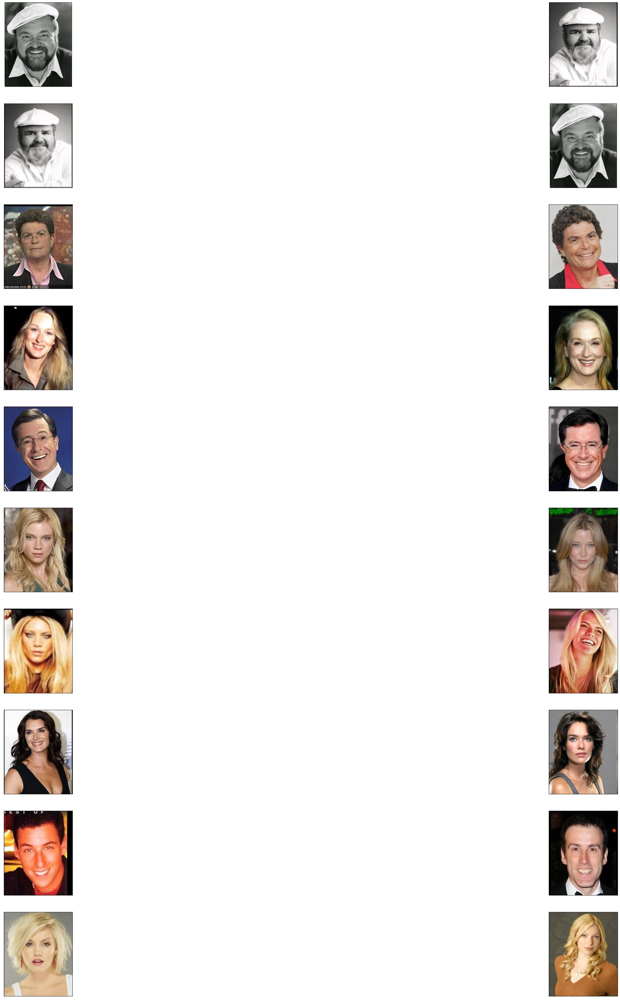

In [85]:
def visualize(b,k):
    """Visualize a few triplets from the supplied batches."""

    def show(ax, image):
        ax.imshow(image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    fig = plt.figure(figsize=(50, 50))

    axs = fig.subplots(k, 2)
    for i in range(k):
        img1=cv2.imread(str(root_dir)+'/data/combined/'+ onlyfiles[b[2*i]])
        img2=cv2.imread(str(root_dir)+'/data/combined/'+ onlyfiles[b[2*i+1]])
        show(axs[i, 0], cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        show(axs[i, 1], cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        


visualize(bI,10)

### Then the euclidean distance pairs.

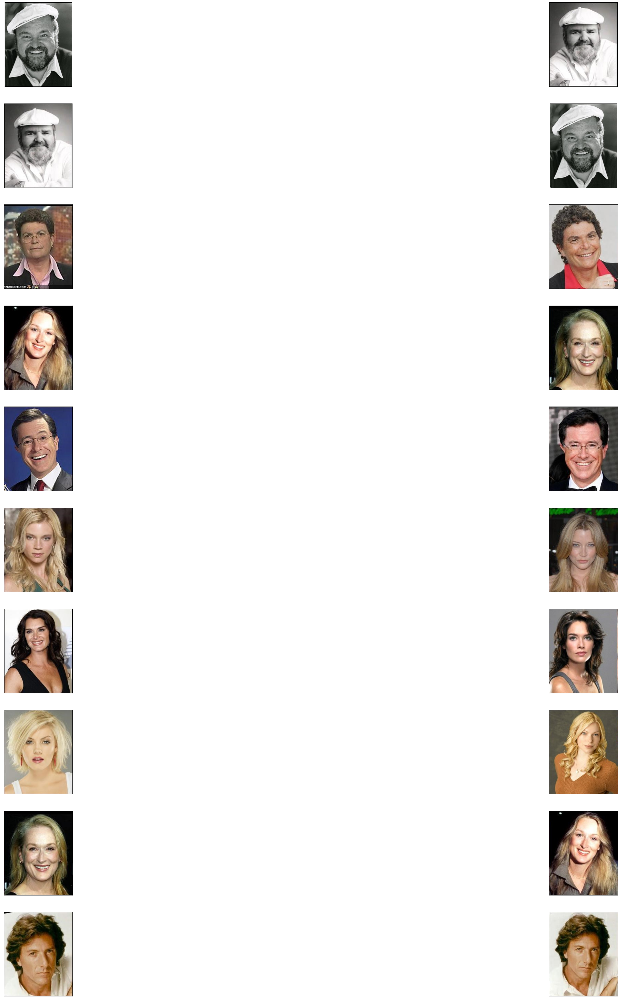

In [86]:
visualize(dI,10)

In [87]:
l=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]

## The pairs of the dataset.

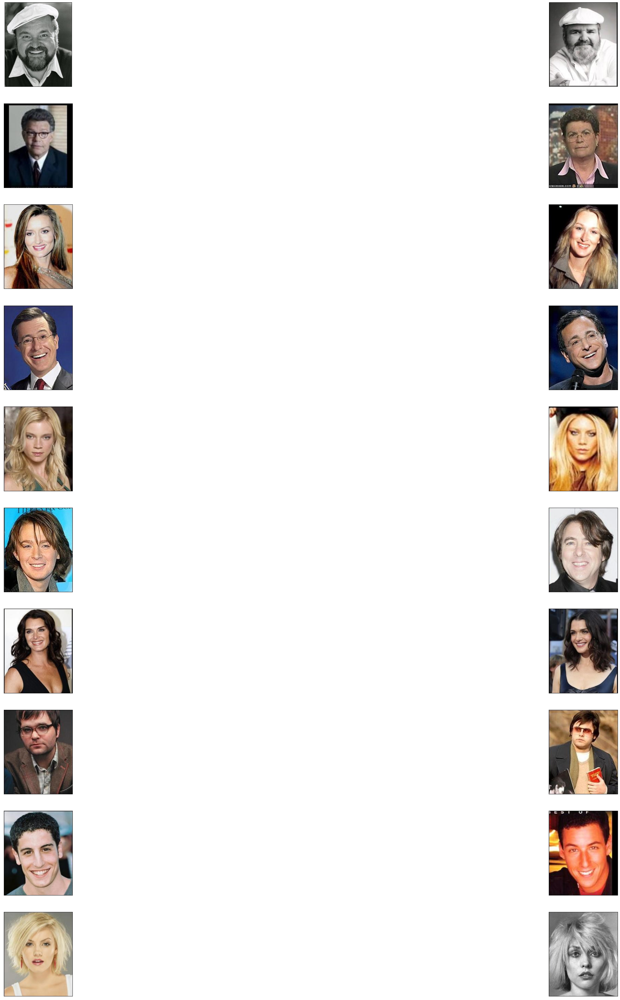

In [88]:
visualize(l,10)

## The VGGFace model combined with the cosine similarity improved the pairs much better since a lot of the pairs originally made in the dataset are a bit random and may be based on some accessories ...